# Analysing the TF-Lite models

In [ ]:
# Importing necessary packages
import tensorflow as tf
import pandas as pd
import os
import importlib.util
import numpy as np
import tensorflow as tf
import cv2
from google.colab.patches import cv2_imshow
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
from scipy import ndimage

In [ ]:
# Finding the sizes of the models
nq_size = os.path.getsize('/content/tflite_model_nq.tflite')
dr_size = os.path.getsize('/content/tflite_model_dr.tflite')
int_size = os.path.getsize('/content/tflite_quant_model_int.tflite')
ff_size = os.path.getsize('/content/tflite_quant_model_ff.tflite')
f16_size = os.path.getsize('/content/tflite_quant_model_f16.tflite')

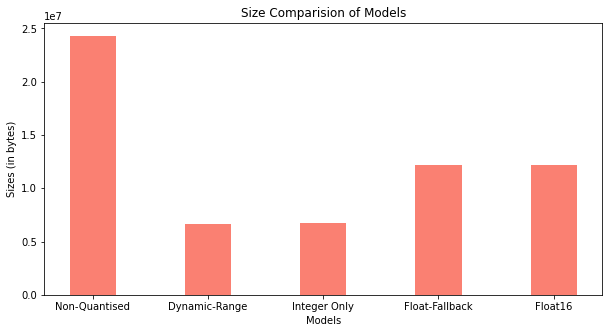

In [ ]:
# Visualising the sizes in the form of a bargraph
import numpy as np
import matplotlib.pyplot as plt
   
data = {'Non-Quantised':nq_size, 'Dynamic-Range':dr_size, 'Integer Only':int_size,
        'Float-Fallback':ff_size, 'Float16': f16_size}

models = list(data.keys())
sizes = list(data.values())
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(models, sizes, color ='salmon', width = 0.4)
plt.xlabel("Models")
plt.ylabel("Sizes (in bytes)")
plt.title("Size Comparision of Models")
plt.show()

In [ ]:
# Finding the percentage model size reduction
percentages = list(map(lambda x: x/sizes[0], sizes))

In [ ]:
# Displaying in the form of a DF
comparision = pd.DataFrame(list(zip(models, sizes, percentages)), 
                           columns =['Models','Sizes','Percentage of Unquantized Model'])
comparision

,Models,Sizes,Percentage of Unquantized Model
0,Non-Quantised,24287460,1.000000
1,Dynamic-Range,6657712,0.274121
2,Integer Only,6744728,0.277704
3,Float-Fallback,12215056,0.502937
4,Float16,12215056,0.502937




---



---



# Helper Functions

In [ ]:
# Helper function
def person_detection(model, images):
  interpreter = tf.lite.Interpreter(model) # Passing the model
  interpreter.allocate_tensors() #Allocates memory for the model's input Tensors

  # Get model details
  input_details = interpreter.get_input_details() 
  output_details = interpreter.get_output_details()

  # Getting height & width  -- 300x300 since our model was trained on 300x300 images
  height = input_details[0]['shape'][1]  
  width = input_details[0]['shape'][2]   

  # Boolean operation to check if model is float or int
  floating_model = (input_details[0]['dtype'] == np.float32)
  uint8_model = (input_details[0]['dtype'] == np.uint8)

  # Uploading the labels & storing in a list
  with open("labels.txt", 'r') as f:
    labels = [line.strip() for line in f.readlines()]

  # Parameter values of the input image in MobileNet 
  input_mean = 127.5 
  input_std = 127.5

  # Specifying a minimum confidence threshold
  min_conf_threshold = 0.50

  ourclasses = []  
  ourscores = []
  count_hum = []
  # Loop over every image and perform detection
  for image_path in images:
      # Load image and resize to expected shape 
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape 
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if floating_model:
        input_data = (np.float32(input_data) - input_mean) / input_std
      
      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'], input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[0]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[1]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[2]['index'])[0] # Confidence of detected objects

      # IF UINT8 MODEL: Obtaining true value from int_8 value 
      # real_value = (int8_value - zero_point)*scale
      if uint8_model:
        scale = interpreter.get_input_details()[0]["quantization"][0] # Getting the scale from the model's input details
        zero_point = interpreter.get_input_details()[0]["quantization"][1] # Getting the zero point from the model's input details
        # Scaling the values correspondingly
        boxes = boxes*scale 
        scores = scores*scale
        classes = classes*scale

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
        # If anything other than a human is detected --> score is set to 0
          if classes[i] != 0:
            scores[i] = 0
          if (scores[i] > min_conf_threshold): # Only considering detections above threshold confidence

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))
              
              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2) # Drawing the rectangular box

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, (scores[i])*100) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              # Draw white box to put label text in
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) 
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text
      
      cv2_imshow(image) # Displaying the image

      humans = np.array(classes) == 0 # Boolean array that contains True if the detected object is a human
      score_tres = np.array(scores) > min_conf_threshold # Boolean array that contains True if the confidence of detection is > threshold
      act_human = (humans & score_tres) * scores # Finding scores of humans that have been detected with a confidence > threshold [Eveything else = 0]

      # Temp variables for each image
      temp_count = 0
      temp_score = []
      temp_classes = []
      for i in act_human:
        if(i > 0): # If detection is human 
          temp_count = temp_count + 1 # Increment count of humans
          temp_score.append(i)        # Append corresponding score in temp_score
          temp_classes.append(0)      # If human: class = 1

      count_hum.append(temp_count)    
      # If there are no humans detected 
      if temp_count == 0: 
        ourclasses.append([1]) # Class = 1
        ourscores.append([1])  # Confidence level = 1
      else:
        # Append temp score & temp class
        ourscores.append(temp_score) 
        ourclasses.append(temp_classes)

  return ourscores, ourclasses, count_hum

In [ ]:
# Displaying output in terms of a DF
def visualise_output(ourscores, ourclasses, count_hum):
  fin_scores=[]
  fin_class=[]
  # Converting all values to string 
  for i in range(len(ourclasses)):
    temp_scoreStr = ' '.join([str(elem) for elem in ourscores[i]])
    temp_classStr = ' '.join([str(elem) for elem in ourclasses[i]])
    fin_scores.append(temp_scoreStr)
    fin_class.append(temp_classStr)
  return pd.DataFrame(list(zip(fin_class,fin_scores,count_hum )),columns =['classes','scores','count'])

# Main Function

In [ ]:
# Main function
# Input parameters: models, images
# Outputs: Resultant DF for image detection for all the models 
def person_detection_outputs(models, images):
  output_dfs = []
  for i in models:
    scores, classes, humans = person_detection(i, images)
    df = visualise_output(scores, classes, humans)
    output_dfs.append(df)

  result = pd.concat(output_dfs,  keys=['TFLite - No Quantisation', 'TFLite - Dynamic Range', 'TFLite - Float Fallback', "TFLite - Integer Only"], axis='columns')
  result.index = images
  return result

# Analysis

In [ ]:
images = ["friends.jpg", "mh.jpg", "catdog.jpg", "people.jpg", "crosswalk.jpg"]

In [ ]:
models = ['/content/tflite_model_dr.tflite', '/content/tflite_model_nq.tflite', '/content/tflite_quant_model_f16.tflite', '/content/tflite_quant_model_ff.tflite', '/content/tflite_quant_model_int.tflite']

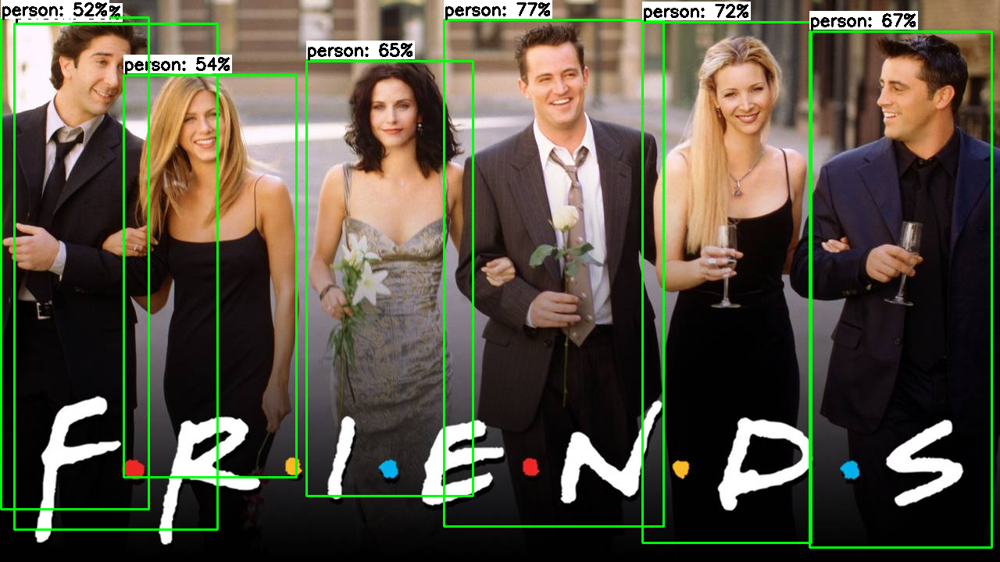

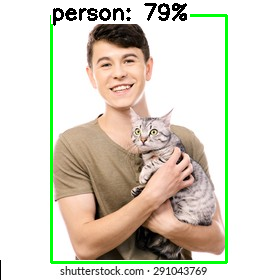

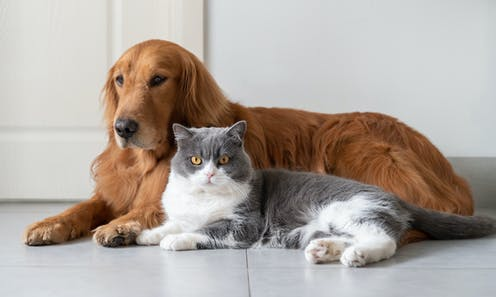

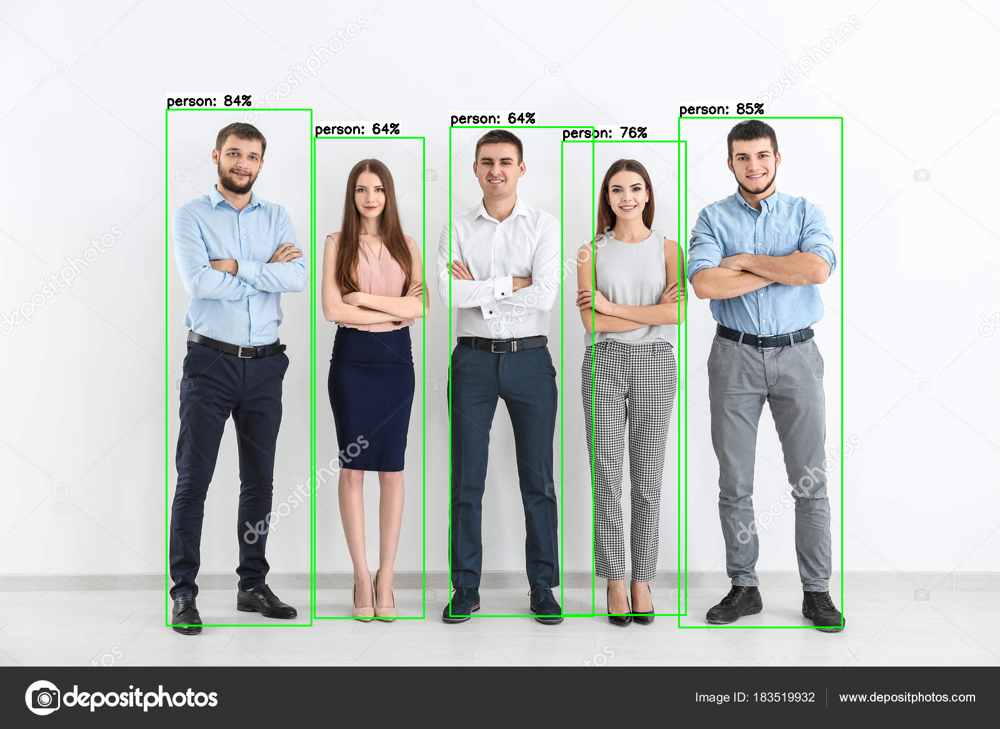

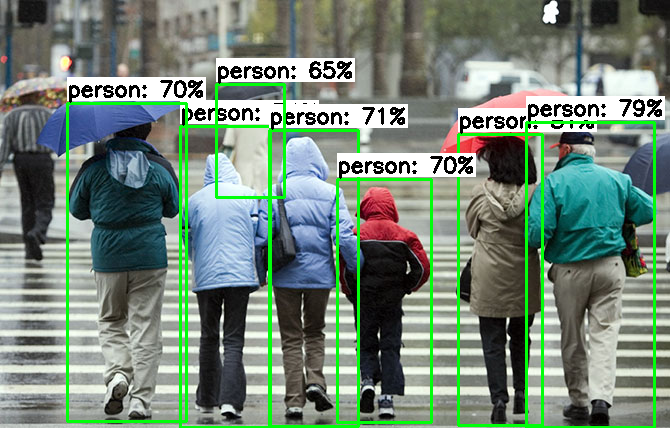

...

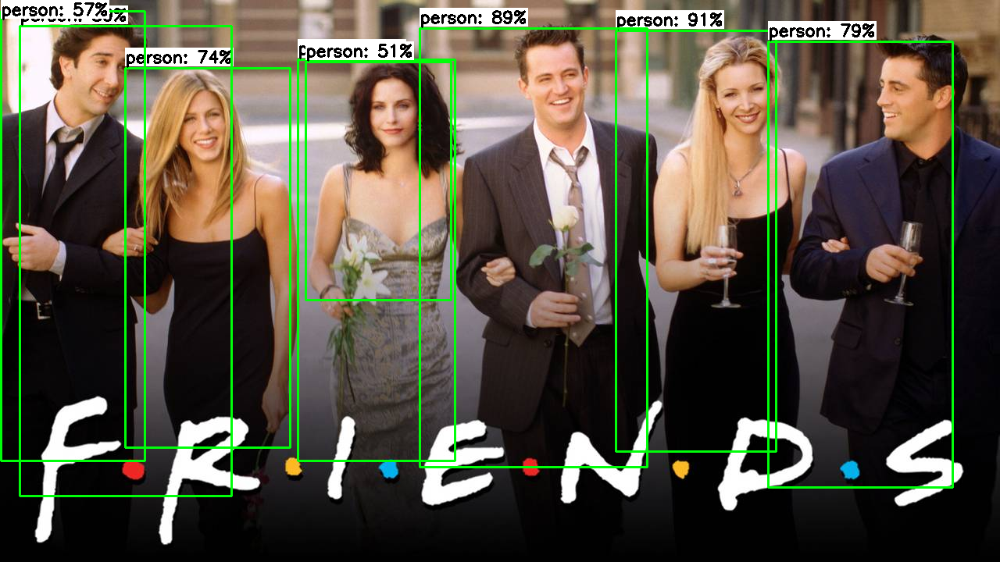

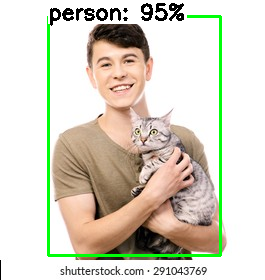

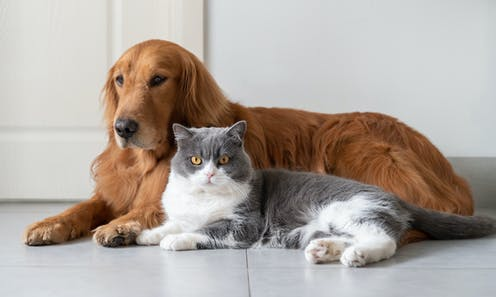

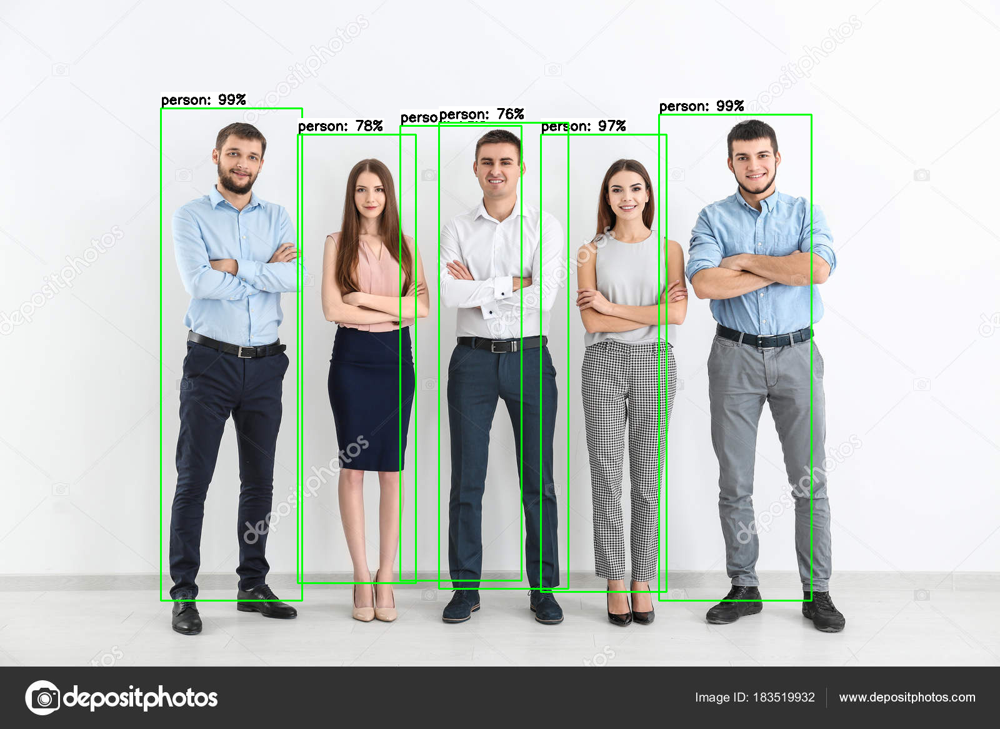

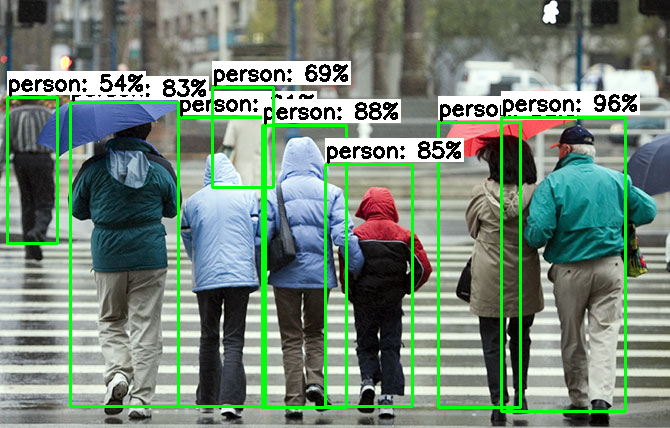

In [ ]:
dfs = person_detection_outputs(models, images)

In [ ]:
dfs

TFLite - No Quantisation  ... TFLite - Integer Only
                               classes  ...                 count
friends.jpg              0 0 0 0 0 0 0  ...                     7
mh.jpg                               0  ...                     1
catdog.jpg                           1  ...                     0
people.jpg                   0 0 0 0 0  ...                     5
crosswalk.jpg            0 0 0 0 0 0 0  ...                     7

[5 rows x 12 columns]

In [ ]:
# Swapping columns to compare based on necessary parameters
columns = ['classes','scores','count']
all_models = dfs.swaplevel(axis='columns')[columns]
all_models.index = images

# Highlighting the DF for differences
def highlight_diff(data, color='salmon'):
    attr = 'background-color: {}'.format(color)
    other = data.xs('TFLite - No Quantisation', axis='columns', level=-1)
    return pd.DataFrame(np.where(data.ne(other, level=0), attr, ''),
                        index=data.index, columns=data.columns)
    
models_compare = all_models.style.apply(highlight_diff, axis=None)
models_compare